<a href="https://colab.research.google.com/github/doggest25/PCVK_Agusty/blob/main/week%205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Buat Gamma Correction sesuai dengan petunjuk berikut
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 3


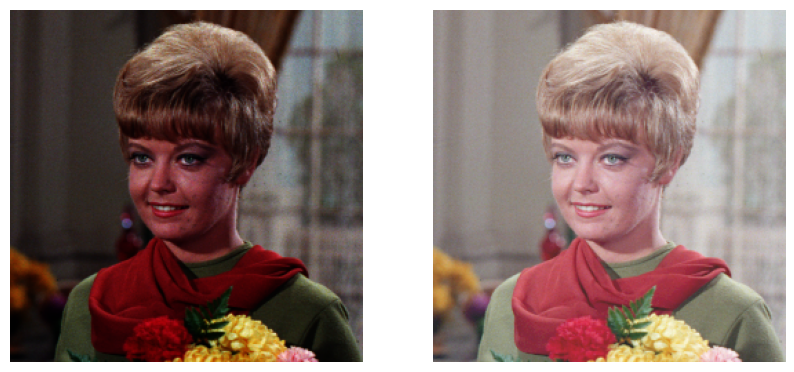

In [10]:
# Meminta input nilai gamma dari pengguna
print('Gamma Correction pada citra')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    exit()

# Fungsi untuk gamma correction
def adjust_gamma(image, gamma):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv.LUT(image, table)

# Membaca gambar
image_path = '/content/drive/MyDrive/PCVK/Images/female.tiff'  # Ganti dengan path gambar Anda
image = cv.imread(image_path)

if image is None:
    print("Error: Gambar tidak ditemukan.")
    exit()

# Melakukan gamma correction
corrected_image = adjust_gamma(image, gamma)

# Menampilkan gambar asli dan hasil gamma correction
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.axis('off')

plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))  # Mengubah BGR ke RGB

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(cv.cvtColor(corrected_image, cv.COLOR_BGR2RGB))

plt.show()

2. Buat Simulasi Image Depth

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

Berikut adalah kode untuk membaca citra masukan dan memberi nilai kedalaman citra,silahkan lanjutkan kode program berikut sehingga menghasilkan keluaran seperti contoh pada Gambar.

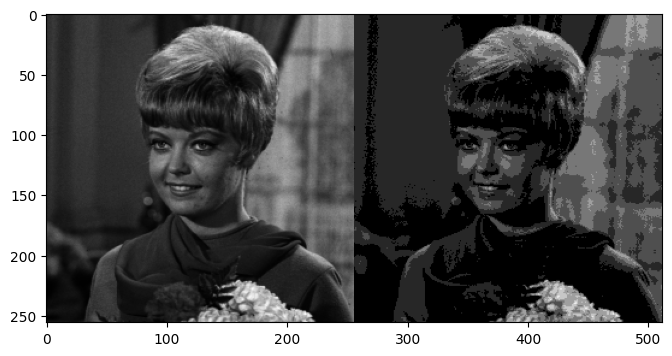

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Membaca citra masukan dalam grayscale
original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff', cv.IMREAD_GRAYSCALE)

if original is None:
    print("Gambar tidak ditemukan. Pastikan path benar.")
    exit()

# Fungsi untuk melakukan kuantisasi citra berdasarkan kedalaman bit
def quantize_image(image, bit_depth):
    level = 255 / (pow(2, bit_depth) - 1)
    quantized_image = (image / level).astype(np.uint8) * level
    return quantized_image

# Menentukan bit-depth yang akan dicoba (misalnya 3-bit)
bit_depth = 3
quantized_image = quantize_image(original, bit_depth)

# Menggabungkan kedua gambar (original dan quantized) secara horizontal
combined_image = np.hstack((original, quantized_image))

# Menampilkan gambar gabungan
plt.figure(figsize=(12, 4))
plt.imshow(combined_image, cmap='gray')

plt.show()


3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).


5

Nilai PSNR dengan 5 citra :  18.134233587114966  dB


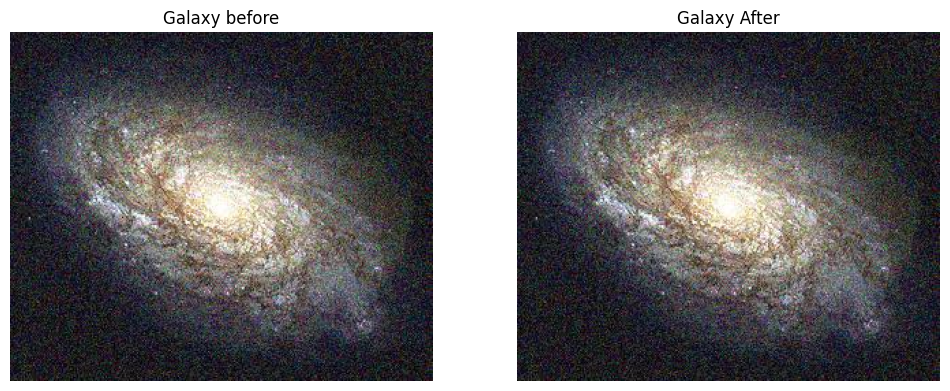

In [4]:


import glob
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt, log10

def PSNR(img1, img2):
  mse = np.mean((img1-img2)**2)
  if(mse==0):
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 1
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 5 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()


10

Nilai PSNR dengan 10 citra :  19.72406166511847  dB


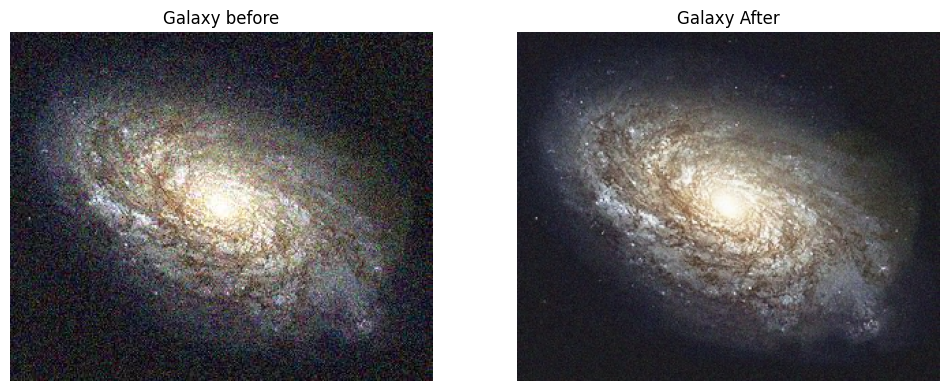

In [5]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 10
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 10 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

20

Nilai PSNR dengan 20 citra :  19.83257430871586  dB


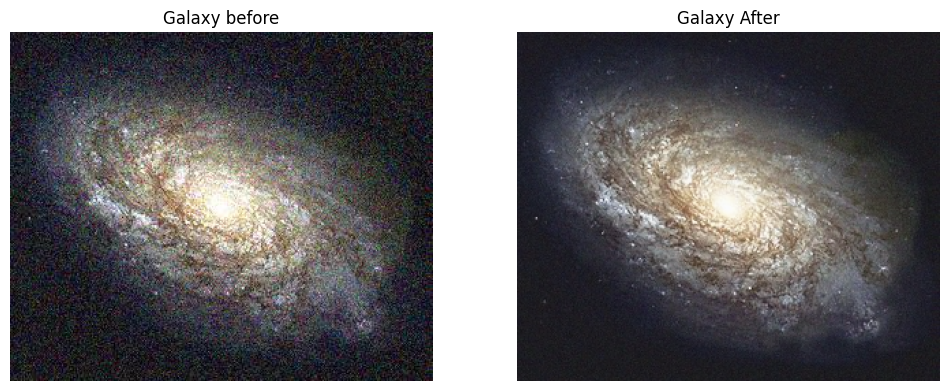

In [6]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 20
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 20 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

40

Nilai PSNR dengan 40 citra :  19.889020645098803  dB


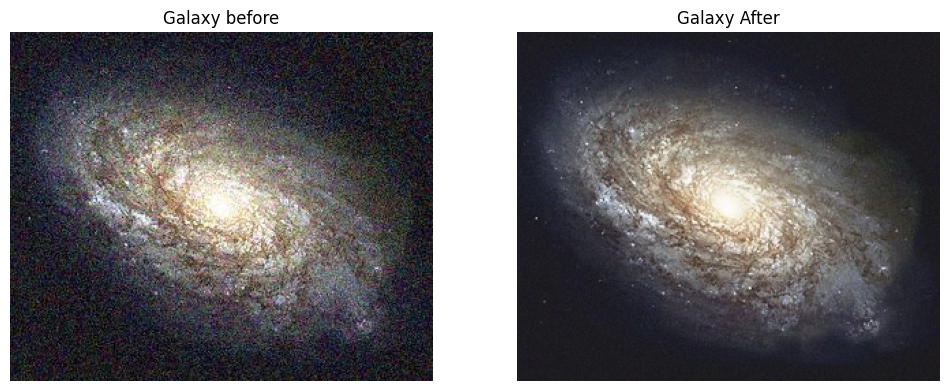

In [9]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 40
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)
print('Nilai PSNR dengan 40 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

80

Nilai PSNR dengan 80 citra :  19.91630005597227  dB


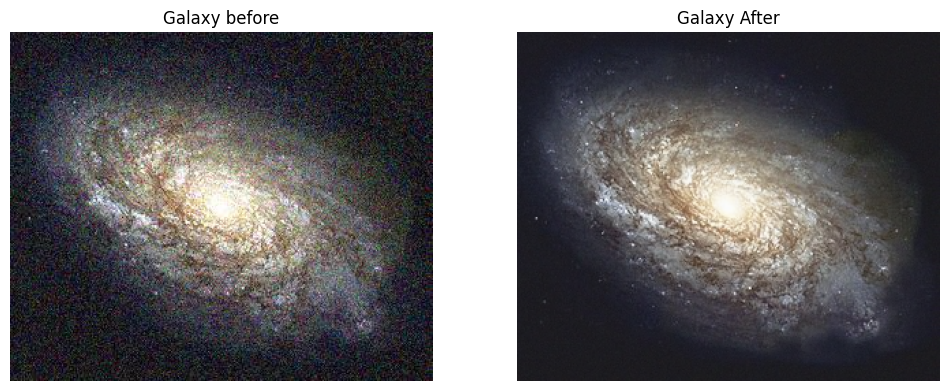

In [8]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 80
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 80 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

100

Nilai PSNR dengan 100 citra :  19.92196095594035  dB


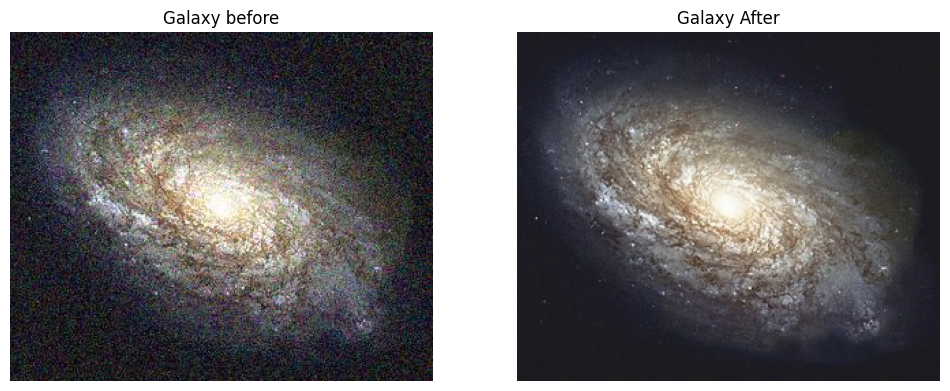

In [11]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 100
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 100 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Semakin banyak jumlah gambar yang digunakan dalam perhitungan denoised_img, maka nilai hasil PNSR semakin tinggi. Jika nilai hasil PNSR tinggi, maka hasil gambar akan semakin jernih/bagus.

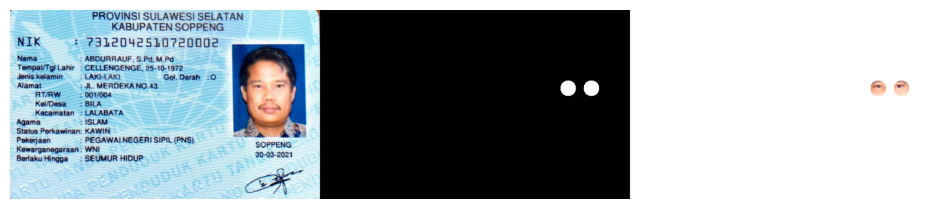

In [36]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Membaca gambar
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')

# Membuat mask dengan lingkaran berisi warna putih dan latar belakang hitam
mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

# Menggabungkan mask dan gambar asli
result = cv.bitwise_and(img, mask)

# Mengganti area di luar mask menjadi warna putih
result[mask == 0] = 255

# Menggabungkan gambar, mask, dan hasil
final_frame = np.hstack((img, mask, result))

# Mengonversi gambar dari BGR ke RGB untuk ditampilkan di Matplotlib
final_frame_rgb = cv.cvtColor(final_frame, cv.COLOR_BGR2RGB)

# Menampilkan gambar menggunakan Matplotlib
plt.figure(figsize=(12, 6))
plt.imshow(final_frame_rgb)
plt.axis('off')

plt.show()


5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini.
Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.


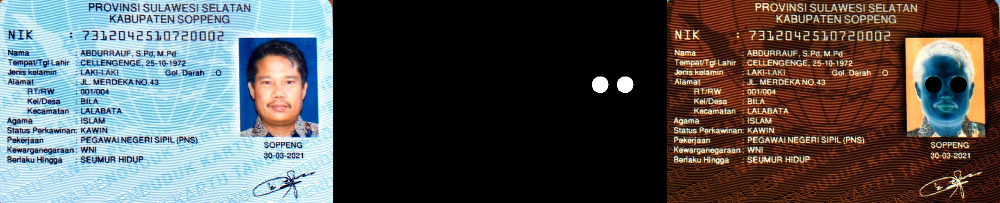

In [39]:
# menggunakan operator not
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)


result = img & mask

masked = ~img & ~mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

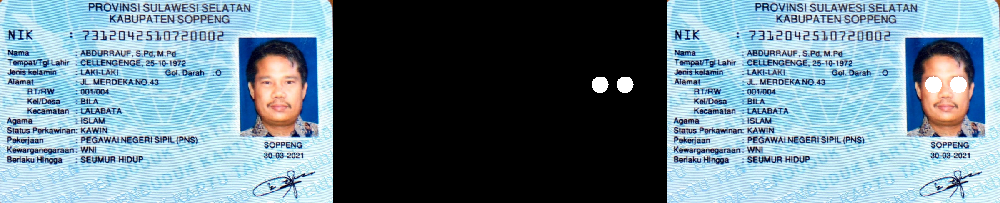

In [40]:
# menggunakan operator or

mask = np.zeros(img.shape,img.dtype)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result = img & mask

masked = img | mask

final_frame = cv.hconcat((img,mask,masked))
cv2_imshow(final_frame)

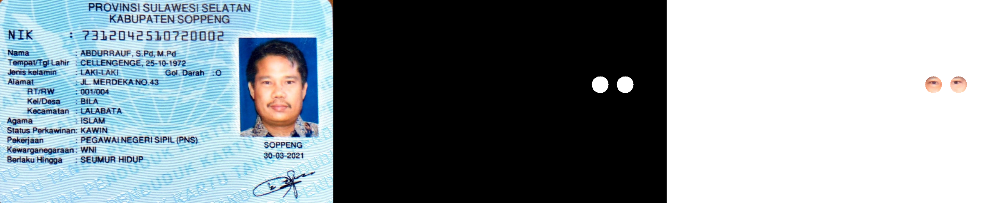

In [41]:
# menggunakan operator and

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result = img & mask
result[mask==0] = 255

final_frame = cv.hconcat((img,mask,result))
cv2_imshow(final_frame)

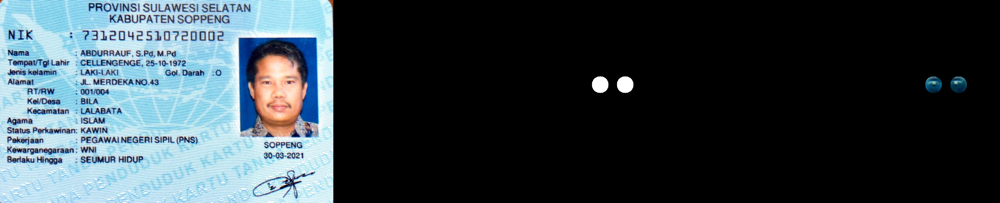

In [43]:
# menggunakan operator nand

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

masked = ~img & mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

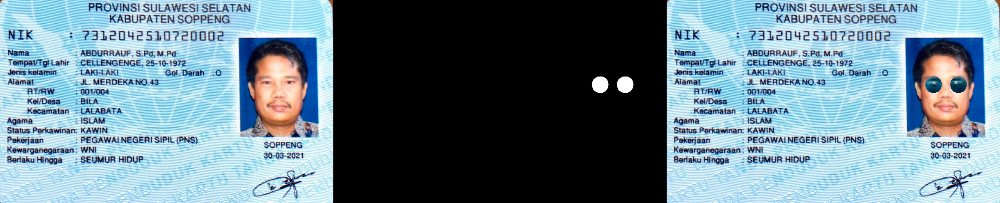

In [44]:
# menggunakan operator xor

mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

masked = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

Hasil Analisa :

Image masking dapat digunakan dalam segmentasi objek. Suatu citra dapat diisolasi objeknya dan dihilangkan background-nya.

Image masking dapat menggunakan operator AND, OR, NOT, NAND, dan XOR.

Operator AND menampilkan piksel di area yang dibuat.

Operator OR menampilkan piksel di luar area yang dibuat.

Operator NOT menampilkan piksel di luar area yang dibuat serta mengubah citra menjadi negatif (inverse).

Operator NAND menampilkan piksel di area yang dibua serta mengubah citra menjadi negatif (inverse).

Operator XOR menampilkan seluruh piksel namun piksel di luar area yang tetap normal (original) serta piksel di luar area menjadi negatif (inverse).